In [1]:
from pathlib import Path

from adain_model import AdaINModel, AdaINLoss
from adain_datamodule import AdaINDataModule
from adain_trainer import AdaINTrainer

import os
os.environ["KERAS_BACKEND"] = "torch"
import keras
import torch

In [ ]:
run_id = 'd0f80523190d4ff8b232fe251fdd55a3'
train_epochs = 7
start_epoch = 29
dataset_size = 100000
lr = 1e-4
decay_rate = 1e-6
decay_steps = 100
style_loss_weight = 10
tv_weight = 1
additional_tags = {'Upsampling' : 'Bilinear', 'Style_loss' : 'Gram_matrix'}

In [3]:
dm = AdaINDataModule(Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/unlabeled2017/"), Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/WikiArt/"), dataset_size=dataset_size, seed=4444, batch_size=8)
if run_id != '' :
    model = AdaINModel.load_from_mlflow(run_id, Path("D:/Python/ML Flow/mlruns"))
else :
    model = AdaINModel()
    model.compile(optimizer='adam')
if decay_rate != 0 :
    model.optimizer.learning_rate = keras.optimizers.schedules.InverseTimeDecay(initial_learning_rate=lr, decay_steps=decay_steps, decay_rate=decay_rate)
else :
    model.optimizer.learning_rate = lr
model.loss_ = AdaINLoss(style_loss_weight=style_loss_weight, tv_weight=tv_weight)

In [4]:
total_epochs = start_epoch + train_epochs
trainer = AdaINTrainer(model, dm, 'adam', mlflow_dir=Path("D:/Python/ML Flow/mlruns"), mlflow_tags={"Dataset size" : dataset_size, "Real training" : True, "Total epochs" : f'{total_epochs} ({10*total_epochs} Keras epochs)', "Start epoch" : start_epoch, **additional_tags})
trainer.train(epochs=10*train_epochs, steps_per_epoch=1000, log_every_n_epochs=10, validation_steps=200, test_steps=200)

Initiating datasets...
Compiling the model...
Model is ready to be trained
Training the model...


Epoch 1/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 536s 536ms/step - loss: 2357772.5000 - val_loss: 2258338.2500
Epoch 2/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 2226443.2500 - val_loss: 2296213.0000
Epoch 3/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 2248157.7500 - val_loss: 2430404.5000
Epoch 4/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 2250188.2500 - val_loss: 2458438.0000
Epoch 5/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 547ms/step - loss: 2332307.2500 - val_loss: 2484623.0000
Epoch 6/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 2307677.0000 - val_loss: 2339916.2500
Epoch 7/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 2291768.2500 - val_loss: 2327667.2500
Epoch 8/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 2275369.5000 - val_loss: 2253218.0000
Epoch 9/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 545ms/step - loss: 2227844.0000 - val_loss: 2299175.0000
Epoch 10/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - los

Epoch 11/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 2197635.0000 - val_loss: 2328813.7500
Epoch 12/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 2285490.7500 - val_loss: 2287691.5000
Epoch 13/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 2292840.5000 - val_loss: 2377247.0000
Epoch 14/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/step - loss: 2271567.7500 - val_loss: 2334975.2500
Epoch 15/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 2269542.0000 - val_loss: 2365253.7500
Epoch 16/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/step - loss: 2281828.5000 - val_loss: 2391062.2500
Epoch 17/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/step - loss: 2273342.5000 - val_loss: 2173519.5000
Epoch 18/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/step - loss: 2235964.7500 - val_loss: 2349442.7500
Epoch 19/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 2279442.5000 - val_loss: 2201015.2500
Epoch 20/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/s

Epoch 21/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/step - loss: 2300352.2500 - val_loss: 2359637.0000
Epoch 22/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 2258813.2500 - val_loss: 2349236.7500
Epoch 23/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 2206108.2500 - val_loss: 2339010.5000
Epoch 24/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 546ms/step - loss: 2277734.5000 - val_loss: 2225187.0000
Epoch 25/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 2224419.0000 - val_loss: 2342447.0000
Epoch 26/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 2189974.5000 - val_loss: 2174087.7500
Epoch 27/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 2258057.7500 - val_loss: 2512114.0000
Epoch 28/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 2236053.0000 - val_loss: 2247661.0000
Epoch 29/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 2212726.7500 - val_loss: 2398663.7500
Epoch 30/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 546ms/s

Epoch 31/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 538s 538ms/step - loss: 2146035.7500 - val_loss: 2457695.5000
Epoch 32/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/step - loss: 2329829.5000 - val_loss: 2457562.2500
Epoch 33/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 2302400.0000 - val_loss: 2303882.2500
Epoch 34/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/step - loss: 2185071.7500 - val_loss: 2228987.2500
Epoch 35/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 2211896.7500 - val_loss: 2283818.5000
Epoch 36/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 2230781.5000 - val_loss: 2221464.7500
Epoch 37/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 538s 538ms/step - loss: 2209657.5000 - val_loss: 2223578.0000
Epoch 38/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 2234425.2500 - val_loss: 2293186.7500
Epoch 39/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 2252840.7500 - val_loss: 2280923.5000
Epoch 40/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/s

Epoch 41/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 2250359.5000 - val_loss: 2234536.7500
Epoch 42/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/step - loss: 2200602.2500 - val_loss: 2230169.5000
Epoch 43/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 2247939.7500 - val_loss: 2326465.2500
Epoch 44/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 2226522.0000 - val_loss: 2268663.2500
Epoch 45/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 2156748.0000 - val_loss: 2387248.0000
Epoch 46/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 2196434.7500 - val_loss: 2281951.2500
Epoch 47/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 2256423.7500 - val_loss: 2258370.2500
Epoch 48/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 2239067.5000 - val_loss: 2173955.5000
Epoch 49/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/step - loss: 2184975.0000 - val_loss: 2346645.2500
Epoch 50/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/s

Epoch 51/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/step - loss: 2115279.0000 - val_loss: 2190945.5000
Epoch 52/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/step - loss: 2227483.5000 - val_loss: 2277416.2500
Epoch 53/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 2207041.5000 - val_loss: 2198771.0000
Epoch 54/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 2153415.5000 - val_loss: 2152616.2500
Epoch 55/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 538s 538ms/step - loss: 2203688.0000 - val_loss: 2291010.2500
Epoch 56/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/step - loss: 2166617.5000 - val_loss: 2262788.7500
Epoch 57/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 538s 538ms/step - loss: 2194163.0000 - val_loss: 2211554.7500
Epoch 58/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 2275747.0000 - val_loss: 2367654.0000
Epoch 59/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 2200770.2500 - val_loss: 2291302.7500
Epoch 60/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/s

Epoch 61/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 2257289.2500 - val_loss: 2306372.7500
Epoch 62/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/step - loss: 2191323.5000 - val_loss: 2190851.2500
Epoch 63/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/step - loss: 2264129.5000 - val_loss: 2285444.7500
Epoch 64/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 2216134.0000 - val_loss: 2261188.2500
Epoch 65/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 2222673.2500 - val_loss: 2087945.1250
Epoch 66/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 2207189.5000 - val_loss: 2141164.5000
Epoch 67/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 2228342.5000 - val_loss: 2187132.2500
Epoch 68/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 2163357.2500 - val_loss: 2186967.7500
Epoch 69/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 544ms/step - loss: 2144905.5000 - val_loss: 2293379.7500
Epoch 70/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/s

In [5]:
imgs = []
torch.random.manual_seed(444)
for i, ((content, style), _) in enumerate(dm._train_dataset) :
    if i == 20 :
        break
    gen_img = model.generate(content, style)
    imgs.append([content.type(torch.int), style.type(torch.int), gen_img])

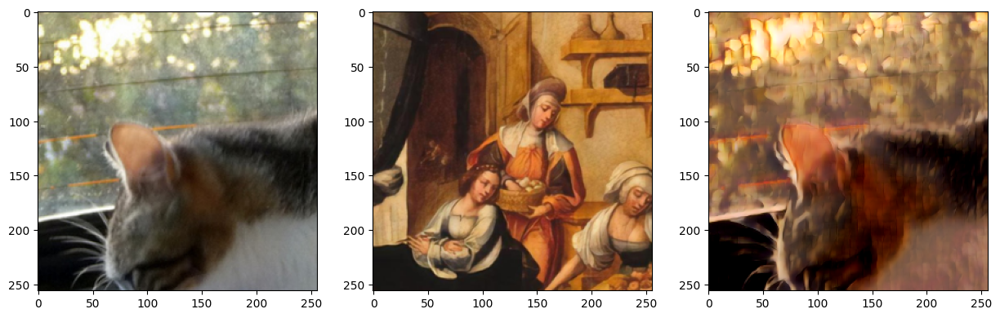

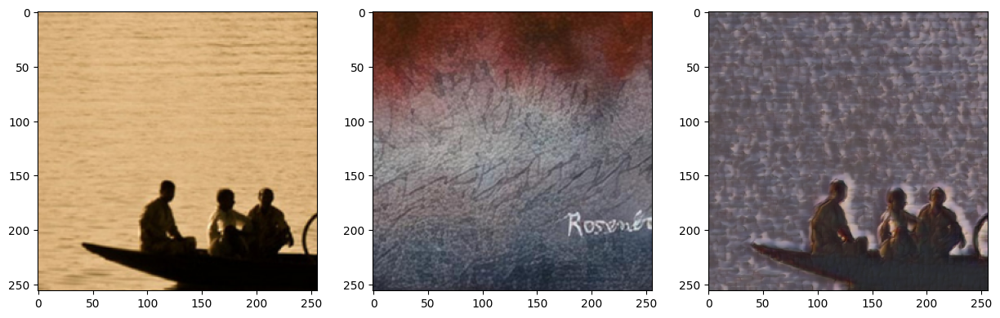

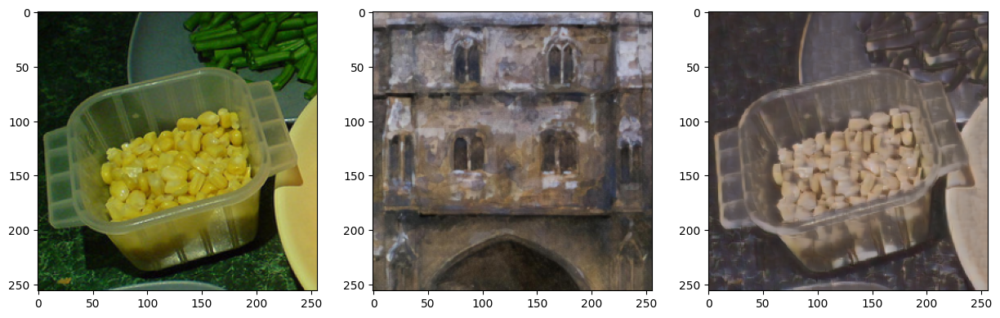

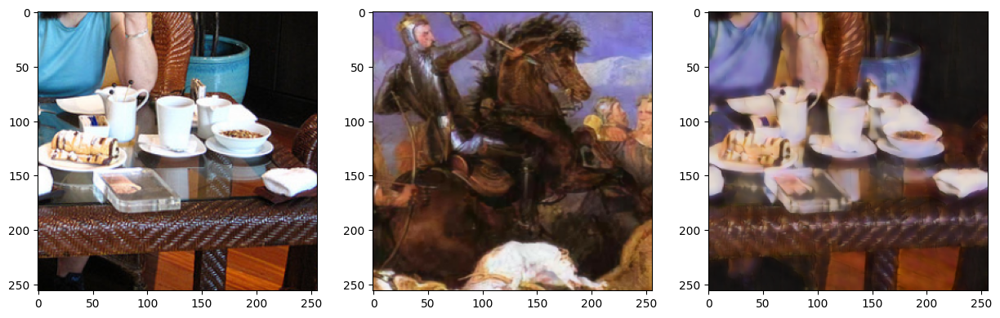

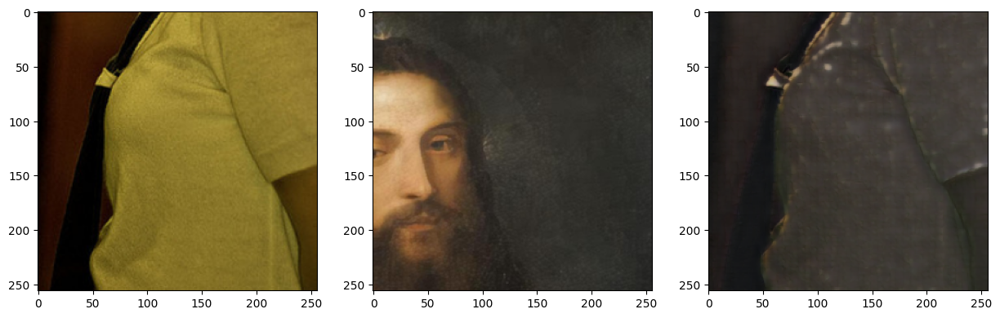

...

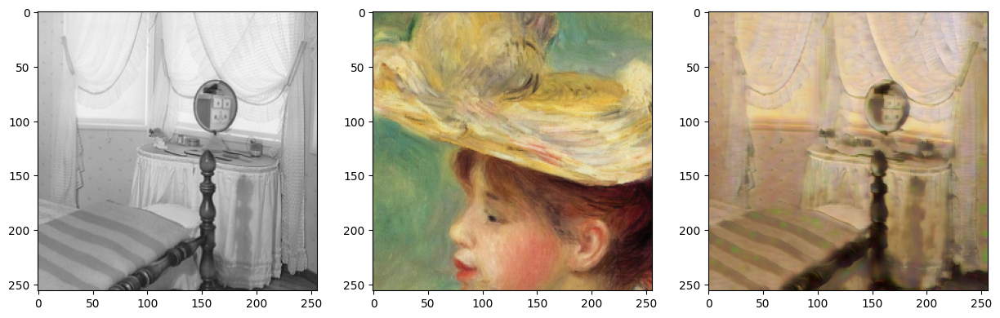

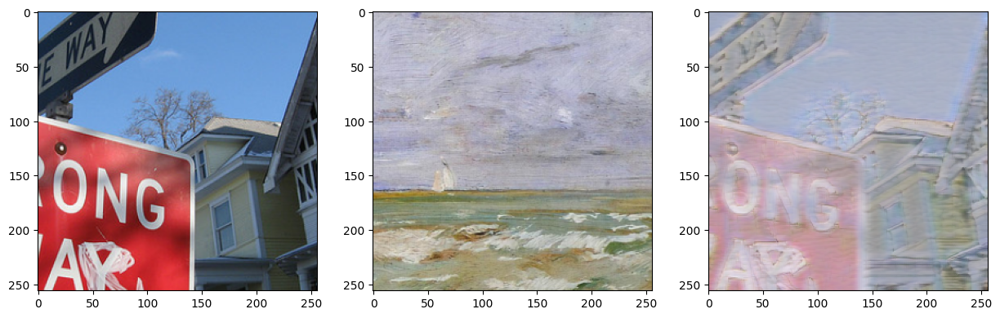

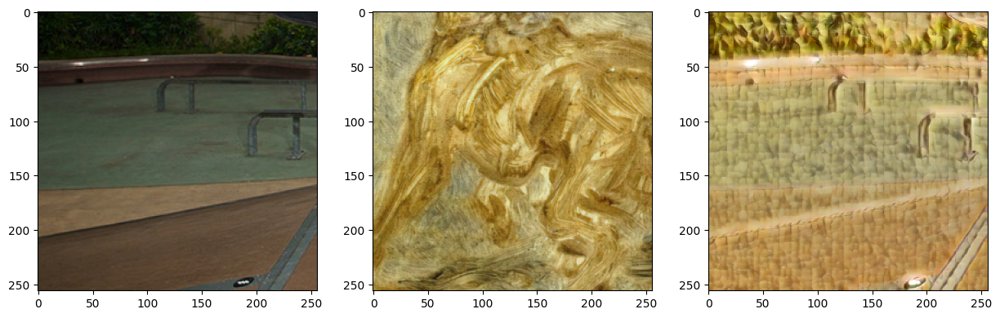

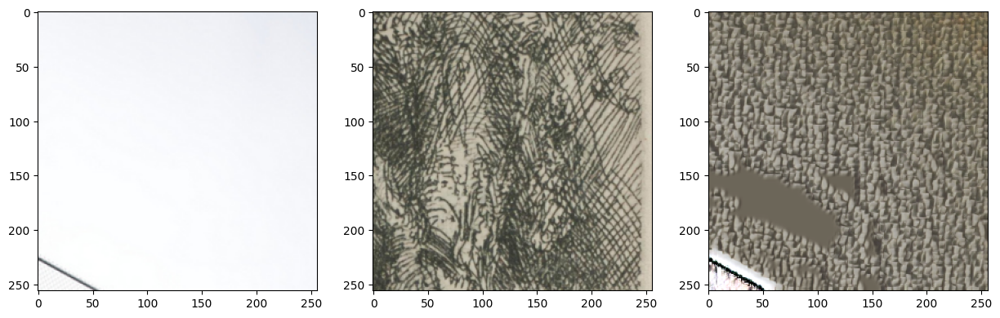

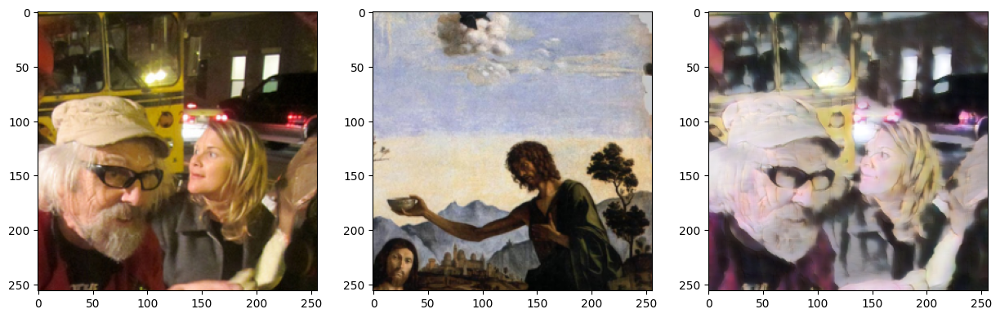

In [6]:
import matplotlib.pyplot as plt

for gen in imgs :
    fig, axs = plt.subplots(1,3, figsize=(15,5))
    for i in range(3) :
        axs[i].imshow(gen[i])
    plt.show()

In [7]:
wolf = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest.jpg')
van_gogh = Path('D:/StyleTransferAI/StyleTransferAI/test_images/van_gogh.jpg')
nature = Path('D:/StyleTransferAI/StyleTransferAI/test_images/nature.jpg')
wp = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wallpaper.jpg')
wolf_big = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest_big.jpg')
lion = Path('D:/StyleTransferAI/StyleTransferAI/test_images/lion.jpg')
fishes = Path('D:/StyleTransferAI/StyleTransferAI/test_images/peinture.webp')
drawing = Path('D:/StyleTransferAI/StyleTransferAI/test_images/croquis.jpg')

size = 1500

wolf_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(wolf))).unsqueeze(0)
sec_size = int((wolf_img.shape[2] / wolf_img.shape[1]) * size)
scaled_wolf = torch.nn.functional.interpolate(wolf_img.permute((0,3,1,2)), (size,sec_size), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

lion_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(lion))).unsqueeze(0)
sec_size_lion = int((lion_img.shape[2] / lion_img.shape[1]) * size)
scaled_lion = torch.nn.functional.interpolate(lion_img.permute((0,3,1,2)), (size,sec_size_lion), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

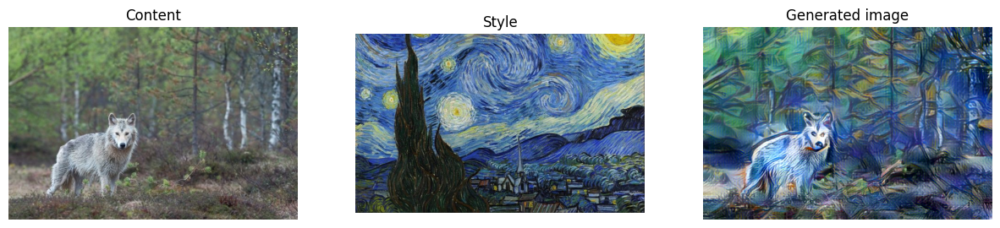

In [13]:
model.generate(wolf, van_gogh, show_img=True, show_inputs=True, resize_size=None)

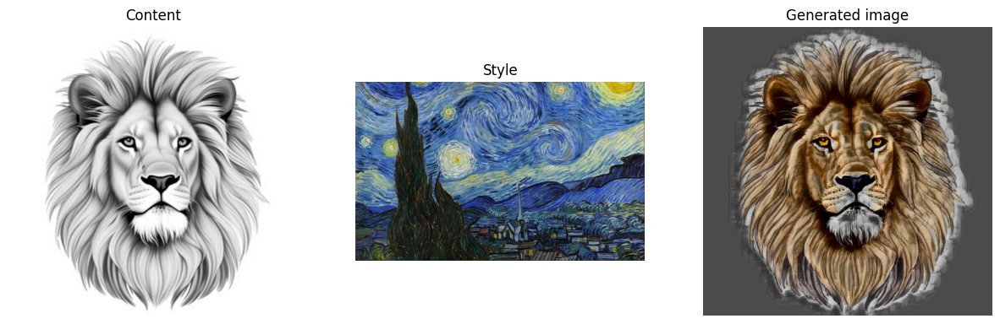

In [9]:
model.generate(scaled_lion, van_gogh, preserve_colors=True, show_img=True, show_inputs=True)

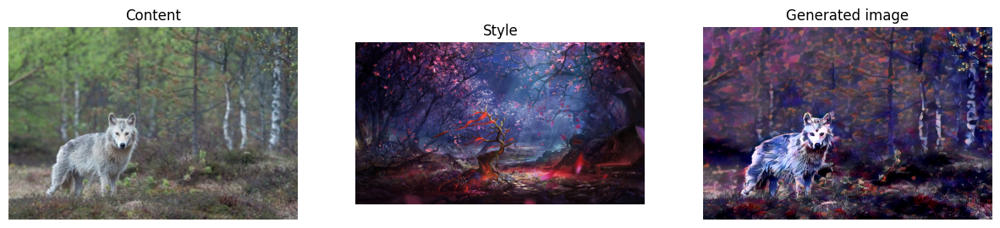

In [10]:
model.generate(scaled_wolf, wp, show_img=True, show_inputs=True)

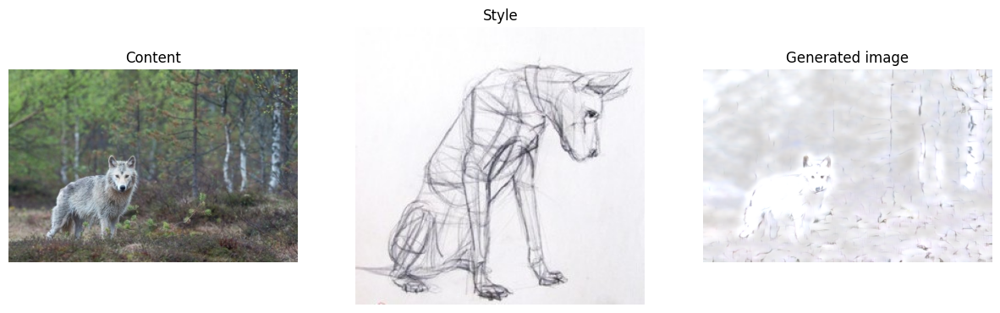

In [11]:
model.generate(scaled_wolf, drawing, show_img=True, show_inputs=True)

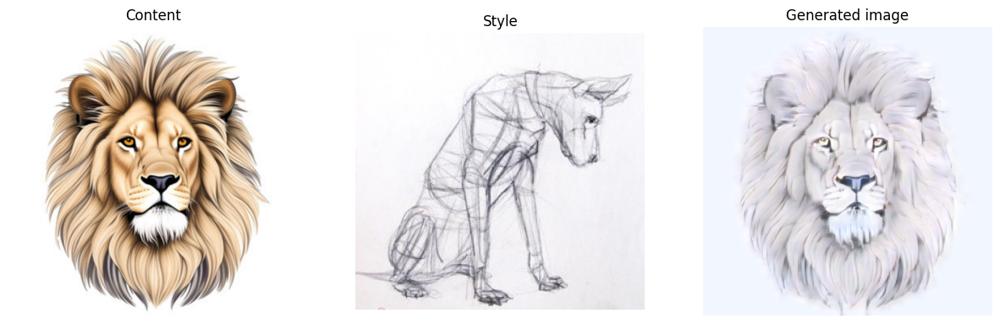

In [12]:
model.generate(scaled_lion, drawing, show_img=True, show_inputs=True)